# COVID-19 Messaging in Canada
## Part 1: Data Wrangling

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import spacy
import nltk
from nltk.tokenize.toktok import ToktokTokenizer

For this project there are three data files. The reports file contains official government statements and news releases from the 10 provinces and 3 territories in Canada. The cases file contains information on COVID-19 case counts and deaths by province and in the country total. The vaccinations file contains information on the proportion of the eligible population partially or fully vaccinated for COVID-19. These last two files were obtained from the Public Health Agency of Canada (PHAC).

Reading in data files:

In [2]:
df_reports = pd.read_csv('../RawData/Reports.csv')
df_cases = pd.read_csv('../RawData/covid19-download.csv')
df_vaccinations = pd.read_csv('../RawData/vaccination-coverage-map.csv')

### Reports Data

In [3]:
df_reports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7324 entries, 0 to 7323
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Organization  7324 non-null   object
 1   Province      7324 non-null   object
 2   Date          7324 non-null   object
 3   Title         7324 non-null   object
 4   Body          7246 non-null   object
dtypes: object(5)
memory usage: 286.2+ KB


It appears that complete data is available for all columns except for Body. The Date column is an object, and will need to be converted to a datetime object at some point.

In [4]:
df_reports.head()

,Organization,Province,Date,Title,Body
0,Province,AB,2020-03-05,Presumptive COVID-19 case reported in Alberta,Alberta’s chief medical officer of health has ...
1,Province,AB,2020-03-05,Statement from the Chief Medical Officer of He...,"Dr. Deena Hinshaw, chief medical officer of he..."
2,Province,AB,2020-03-06,Second presumptive COVID-19 case reported in A...,Alberta’s chief medical officer of health has ...
3,Province,AB,2020-03-08,Two new presumptive COVID-19 cases in Alberta,Alberta’s chief medical officer of health has ...
4,Province,AB,2020-03-09,New cases of COVID-19 confirmed in Alberta,Alberta’s chief medical officer of health has ...


This .csv file was sorted by Province and then by Date, so Alberta shows up first in the list. 

Organization is not relevant unless using the country-level reports which are indicated by "CAN" in the Province column and which specify a department in the Organization column. This can be seen here here:

In [5]:
df_reports.loc[df_reports.Province=='CAN'].head()

,Organization,Province,Date,Title,Body
6764,PHAC,CAN,2021-09-03,Statement from the Chief Public Health Officer...,The COVID-19 pandemic continues to create stre...
6765,PHAC,CAN,2021-08-27,Statement from the Chief Public Health Officer...,The COVID-19 pandemic continues to create stre...
6766,PHAC,CAN,2021-08-20,Statement from the Chief Public Health Officer...,The COVID-19 pandemic continues to create stre...
6767,PHAC,CAN,2021-08-13,Statement from the Chief Public Health Officer...,The COVID-19 pandemic continues to create stre...
6768,PHAC,CAN,2021-08-12,Remarks from the Chief Public Health Officer o...,The COVID-19 pandemic continues to create stre...


Also of note is that some provinces use very uniform formatting for article titles, which may affect the usefulness of the title data. An example of this can be seen here:

In [6]:
df_reports.loc[df_reports.Province=='MB'].head()

,Organization,Province,Date,Title,Body
1022,Province,MB,2020-01-28,PROVINCE CONTINUES TO PREPARE FOR NOVEL CORONA...,"Risk of Virus Remains Low in Manitoba, But Off..."
1023,Province,MB,2020-01-31,NOVEL CORONAVIRUS BULLETIN #1,The World Health Organization has declared the...
1024,Province,MB,2020-02-07,NOVEL CORONAVIRUS BULLETIN #2,"Manitoba Health, Seniors and Active Living and..."
1025,Province,MB,2020-02-13,NOVEL CORONAVIRUS BULLETIN #3,"Manitoba Health, Seniors and Active Living and..."
1026,Province,MB,2020-02-20,NOVEL CORONAVIRUS (COVID-19) BULLETIN #4,"Manitoba Health, Seniors and Active Living and..."


Some provinces may have more repetitious or uniform releases in the article body as well, which can be explored later.

Next, a column was added to track word count of the Body text.

In [7]:
df_reports['Word_Count'] = df_reports['Body'].str.split().str.len()
df_reports.head()

,Organization,Province,Date,Title,Body,Word_Count
0,Province,AB,2020-03-05,Presumptive COVID-19 case reported in Alberta,Alberta’s chief medical officer of health has ...,418.0
1,Province,AB,2020-03-05,Statement from the Chief Medical Officer of He...,"Dr. Deena Hinshaw, chief medical officer of he...",303.0
2,Province,AB,2020-03-06,Second presumptive COVID-19 case reported in A...,Alberta’s chief medical officer of health has ...,480.0
3,Province,AB,2020-03-08,Two new presumptive COVID-19 cases in Alberta,Alberta’s chief medical officer of health has ...,466.0
4,Province,AB,2020-03-09,New cases of COVID-19 confirmed in Alberta,Alberta’s chief medical officer of health has ...,557.0


Next, let's check out the missing values noted earlier:

In [8]:
missing = pd.concat([df_reports.isnull().sum(), 100 * df_reports.isnull().mean()], axis=1)
missing.columns=['count','%']
missing.sort_values(by='count',ascending=True)

,count,%
Organization,0,0.000000
Province,0,0.000000
Date,0,0.000000
Title,0,0.000000
Body,78,1.064992
Word_Count,78,1.064992


All the missing values occur in the Body or Word_Count. Word_Count is calculated based on Body so this is not surprising. Let's look more closely at where the missing Body values are occuring.

In [9]:
missing_text = df_reports.Body.isnull().groupby([df_reports['Province']]).sum().astype(int)
print(missing_text)

Province
AB        4
BC        0
CAN       0
CAN-N     0
MB        0
NB        0
NL        1
NS        0
NT        0
NU        0
ON        0
PEI       0
QC       72
SK        1
YT        0
Name: Body, dtype: int64


A large number of the missing articles are from Quebec. As we can see from the total number of articles for Quebec, 72 makes up a large portion (almost 40%) of Quebec's articles. 

In [10]:
number_reports = df_reports['Province'].value_counts()
print(number_reports)

ON       1157
NS        765
NL        643
SK        596
MB        587
BC        513
AB        509
NB        497
CAN       425
PEI       395
NU        387
YT        275
NT        258
QC        182
CAN-N     135
Name: Province, dtype: int64


Next, let's look at the average word count by Province:

In [11]:
word_count_means = df_reports.groupby('Province')[['Word_Count']].mean()
print(word_count_means)

          Word_Count
Province            
AB        816.259406
BC        509.729045
CAN       665.160000
CAN-N     758.592593
MB        504.085179
NB        476.615694
NL        394.873832
NS        482.133333
NT        470.406977
NU        301.294574
ON        666.385480
PEI       346.389873
QC        266.190909
SK        720.112605
YT        399.887273


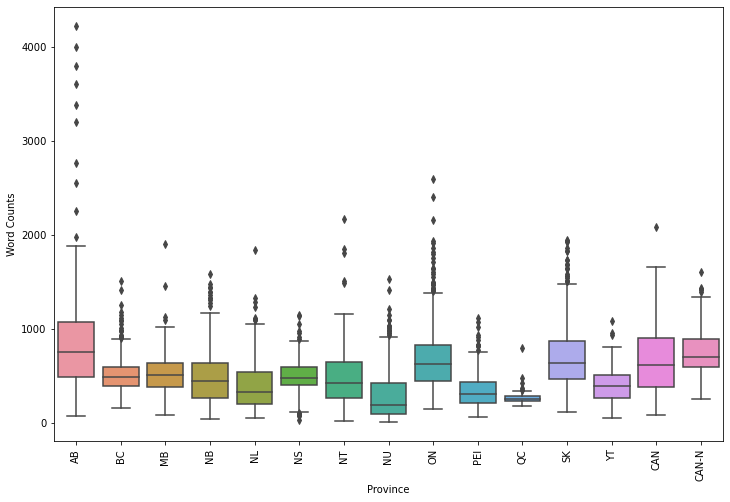

In [12]:
plt.subplots(figsize=(12, 8))
sns.boxplot(x='Province', y='Word_Count', data=df_reports)
plt.xticks(rotation='vertical')
plt.ylabel('Word Counts')
plt.xlabel('Province');

Alberta seems to have quite a few outliers, with values higher than any other province. Let's take a closer look at articles with word counts over 3000:

In [13]:
df_reports.loc[df_reports.Word_Count > 3000]

,Organization,Province,Date,Title,Body,Word_Count
136,Province,AB,2020-05-10,Weekly overview of COVID-19 action plan,The Government of Alberta is improving testing...,3203.0
150,Province,AB,2020-05-17,Weekly overview of COVID-19 action plan,The Government of Alberta is prioritizing safe...,3379.0
162,Province,AB,2020-05-24,Weekly overview of COVID-19 action plan,The Government of Alberta continues to roll ou...,3601.0
173,Province,AB,2020-05-31,Weekly overview of COVID-19 action plan,The province has now committed a total of $13 ...,3796.0
184,Province,AB,2020-06-07,Weekly overview of COVID-19 action plan,As infection and hospitalization rates remain ...,3995.0
192,Province,AB,2020-06-14,Weekly overview of COVID-19 action plan,As stage 2 of Alberta's relaunch begins earlie...,4217.0


Let's look more closely at some of the articles with the least number of words.

In [14]:
df_reports.loc[df_reports.Word_Count < 50]

,Organization,Province,Date,Title,Body,Word_Count
1635,Province,NB,2020-03-19,Provincial parks are closed,Following the provincial government’s decision...,39.0
1843,Province,NB,2020-11-11,No new cases of COVID-19,Public Health reported no new cases of COVID-1...,48.0
2757,Province,NS,2020-03-14,Shubenacadie Wildlife Park to Close,Given the concern of COVID-19 and recent guida...,32.0
3517,Province,NT,2020-03-14,Public Health Advisories Link,To access Public Health Advisories distributed...,19.0
3541,Province,NT,2020-03-30,"Indigenous, Territorial and Federal leaders mo...",The attached is being released on behalf of In...,18.0
3785,Province,NU,2020-03-19,COVID-19 Department of Economic Development an...,Department of Economic Development and Transpo...,45.0
3789,Province,NU,2020-03-20,COVID-19 GN Update for Department of Education,Adjusted services:\n\nTo reinforce social dist...,47.0
3791,Province,NU,2020-03-20,COVID-19 Department of Economic Development an...,Department of Economic Development and Transpo...,47.0
3798,Province,NU,2020-03-23,COVID-19 Department of Environment Services up...,Department of Environment Services update - Ma...,31.0
3801,Province,NU,2020-03-24,COVID-19 GN Department of Community and Govern...,"Effective today, all GN office buildings will ...",48.0


In [15]:
df_reports.loc[df_reports.Word_Count <30]

,Organization,Province,Date,Title,Body,Word_Count
3517,Province,NT,2020-03-14,Public Health Advisories Link,To access Public Health Advisories distributed...,19.0
3541,Province,NT,2020-03-30,"Indigenous, Territorial and Federal leaders mo...",The attached is being released on behalf of In...,18.0
3804,Province,NU,2020-03-24,COVID-19 Department of Environment Services up...,Department of Environment Services update - Ma...,23.0
3806,Province,NU,2020-03-25,COVID-19 GN Update for Department of Education,Ongoing services:\n\nBus service contracts wil...,15.0
3807,Province,NU,2020-03-25,COVID-19 GN Department of Community and Govern...,Core service delivery continues\nCGS Local Gov...,23.0
3853,Province,NU,2020-04-22,COVID-19 Department of Economic Development an...,Department of Economic Development and Transpo...,12.0
3865,Province,NU,2020-04-30,COVID-19 Department of Economic Development an...,Department of Economic Development and Transpo...,26.0
3917,Province,NU,2020-07-08,Guidelines for Non-Nunavut Residents to Enter ...,Information on the process for companies and i...,23.0
4011,Province,NU,2020-11-20,COVID-19 Department of Environment Services up...,Department of Environment Services - November ...,16.0
4087,Province,NU,2021-04-28,COVID-19 GN Department of Community and Govern...,Department of Community and Government Service...,27.0


Next, let's convert the Date column to a datetime object.

In [16]:
df_reports['Date'] = pd.to_datetime(df_reports['Date'])
df_reports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7324 entries, 0 to 7323
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Organization  7324 non-null   object        
 1   Province      7324 non-null   object        
 2   Date          7324 non-null   datetime64[ns]
 3   Title         7324 non-null   object        
 4   Body          7246 non-null   object        
 5   Word_Count    7246 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(4)
memory usage: 343.4+ KB


Before dropping the rows with missing Body from the dataframe, let's see what can be learned from the original number of reports for each area. Here we have the number of reports for each area, including those with missing text:

In [17]:
number_reports = df_reports.groupby('Province')[['Province']].count()
print(number_reports)

          Province
Province          
AB             509
BC             513
CAN            425
CAN-N          135
MB             587
NB             497
NL             643
NS             765
NT             258
NU             387
ON            1157
PEI            395
QC             182
SK             596
YT             275


Next, a new dataframe is created to look at the number of reports for each area, the total number of days covered by the reporting for each area, and the frequency of reporting for that area. 

In [18]:
frequencies=[]
cols = ['Province', 'First', 'Last', 'Number_Reports', 'Number_Days', 'Frequency']

frequency_df = pd.DataFrame(frequencies, columns=cols)
for province in df_reports['Province'].unique():
    date=df_reports['Date'].loc[df_reports.Province == province]
    earliest=date.min()
    latest=date.max()
    number_days = (latest-earliest).days
    
    number_reports = df_reports['Province'].loc[df_reports.Province==province].count()
    
    frequency = number_reports/number_days

    frequencies.append([province, earliest, latest, number_reports, number_days, frequency])
    #print(province, number_days, number_reports, frequency)
    
frequency_df = pd.DataFrame(frequencies, columns=cols)
print(frequency_df)

   Province      First       Last  Number_Reports  Number_Days  Frequency
0        AB 2020-03-05 2021-07-30             509          512   0.994141
1        BC 2020-01-21 2021-08-04             513          561   0.914439
2        MB 2020-01-28 2021-08-19             587          569   1.031634
3        NB 2020-03-01 2021-08-08             497          525   0.946667
4        NL 2020-03-06 2021-08-06             643          518   1.241313
5        NS 2020-02-28 2021-08-11             765          530   1.443396
6        NT 2020-03-13 2021-08-03             258          508   0.507874
7        NU 2020-01-31 2021-08-05             387          552   0.701087
8        ON 2020-02-23 2021-08-13            1157          537   2.154562
9       PEI 2020-02-28 2021-08-27             395          546   0.723443
10       QC 2021-01-16 2021-09-03             182          230   0.791304
11       SK 2020-02-13 2021-08-24             596          558   1.068100
12       YT 2020-03-07 2021-08-09     

From this we can see Ontario (ON) has a relatively high frequency of reporting and Northwest Territories (NT) has the lowest frequency of reporting.

It is also possible to see that (excluding CAN-N) the latest first date is 03/13/2020 and the earliest last date is 07/30/2021. Thus the date range for which there is data for all provinces and territories is: 03/13/2020 to 07/30/2021. The CAN and CAN-N values are ignored for now as these are country level data and the focus is primarily on the provincial/territorial level data. The CAN data includes statements and the CAN-N data includes news releases from the federal government. The CAN-N data is not complete, and only includes 135 values from the most recent news releases included on the dedicated COVID-19 announcements page on the federal government website.

Now that this information has been saved in a separate dataframe, let's drop the reports rows with missing data for "Body".

In [19]:
#drop missing reports rows after saving frequency data
df_reports.dropna(subset = ["Body"], inplace=True)

There should not be any null values left. This is verified here:

In [20]:
missing_text = df_reports.Body.isnull().groupby([df_reports['Province']]).sum().astype(int)
print(missing_text)

Province
AB       0
BC       0
CAN      0
CAN-N    0
MB       0
NB       0
NL       0
NS       0
NT       0
NU       0
ON       0
PEI      0
QC       0
SK       0
YT       0
Name: Body, dtype: int64


Checking the new number of reports once the rows with missing values have been removed:

In [21]:
number_reports = df_reports['Province'].value_counts()
print(number_reports)

ON       1157
NS        765
NL        642
SK        595
MB        587
BC        513
AB        505
NB        497
CAN       425
PEI       395
NU        387
YT        275
NT        258
CAN-N     135
QC        110
Name: Province, dtype: int64


Looking at the average word count by province once rows with missing values are dropped:

In [22]:
word_count_means = df_reports.groupby('Province')[['Word_Count']].mean()
print(word_count_means)

          Word_Count
Province            
AB        816.259406
BC        509.729045
CAN       665.160000
CAN-N     758.592593
MB        504.085179
NB        476.615694
NL        394.873832
NS        482.133333
NT        470.406977
NU        301.294574
ON        666.385480
PEI       346.389873
QC        266.190909
SK        720.112605
YT        399.887273


In [23]:
#for the rest of the steps regarding df_reports, following some of the suggestions from: https://towardsdatascience.com/a-practitioners-guide-to-natural-language-processing-part-i-processing-understanding-text-9f4abfd13e72

#remove contractions?
#remove accented and special characters? numbers?

Lemmatization:

In [24]:
#lemmatization (requires removal of null values first)
nlp = spacy.load("en_core_web_sm")
lemmatization = []
for i in df_reports['Body']:
    article = nlp(i)
    article = ' '.join([word.lemma_ if word.lemma_ != '-PRON-' else word.text for word in article])
    lemmatization.append([article])
df_reports['Lemmatization'] = lemmatization

In [25]:
df_reports.head()

,Organization,Province,Date,Title,Body,Word_Count,Lemmatization
0,Province,AB,2020-03-05,Presumptive COVID-19 case reported in Alberta,Alberta’s chief medical officer of health has ...,418.0,[Alberta ’s chief medical officer of health ha...
1,Province,AB,2020-03-05,Statement from the Chief Medical Officer of He...,"Dr. Deena Hinshaw, chief medical officer of he...",303.0,"[Dr. Deena Hinshaw , chief medical officer of ..."
2,Province,AB,2020-03-06,Second presumptive COVID-19 case reported in A...,Alberta’s chief medical officer of health has ...,480.0,[Alberta ’s chief medical officer of health ha...
3,Province,AB,2020-03-08,Two new presumptive COVID-19 cases in Alberta,Alberta’s chief medical officer of health has ...,466.0,[Alberta ’s chief medical officer of health ha...
4,Province,AB,2020-03-09,New cases of COVID-19 confirmed in Alberta,Alberta’s chief medical officer of health has ...,557.0,[Alberta ’s chief medical officer of health ha...


Removing stop words:

In [26]:
#remove stopwords from standard nltk stopword list with removal of no and not
tokenizer = ToktokTokenizer()
stopword_list = nltk.corpus.stopwords.words('english')
stopword_list.remove('no')
stopword_list.remove('not')

stop = []
for i in df_reports.Lemmatization:
    tokens = tokenizer.tokenize(i)
    tokens = [token.strip() for token in tokens]
    filtered_tokens = [token for token in tokens if token.lower() not in stopword_list]
    stops = ' '.join(filtered_tokens)    
    stop.append([stops])
df_reports['Stop'] = stop

In [27]:
df_reports.head()

,Organization,Province,Date,Title,Body,Word_Count,Lemmatization,Stop
0,Province,AB,2020-03-05,Presumptive COVID-19 case reported in Alberta,Alberta’s chief medical officer of health has ...,418.0,[Alberta ’s chief medical officer of health ha...,[[ ' Alberta ’ chief medical officer health co...
1,Province,AB,2020-03-05,Statement from the Chief Medical Officer of He...,"Dr. Deena Hinshaw, chief medical officer of he...",303.0,"[Dr. Deena Hinshaw , chief medical officer of ...","[[ ' Dr. Deena Hinshaw , chief medical officer..."
2,Province,AB,2020-03-06,Second presumptive COVID-19 case reported in A...,Alberta’s chief medical officer of health has ...,480.0,[Alberta ’s chief medical officer of health ha...,[[ ' Alberta ’ chief medical officer health co...
3,Province,AB,2020-03-08,Two new presumptive COVID-19 cases in Alberta,Alberta’s chief medical officer of health has ...,466.0,[Alberta ’s chief medical officer of health ha...,[[ ' Alberta ’ chief medical officer health an...
4,Province,AB,2020-03-09,New cases of COVID-19 confirmed in Alberta,Alberta’s chief medical officer of health has ...,557.0,[Alberta ’s chief medical officer of health ha...,[[ ' Alberta ’ chief medical officer health an...


### COVID-19 Case Count and Death Data

In [28]:
df_cases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8292 entries, 0 to 8291
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   pruid                8292 non-null   int64  
 1   prname               8292 non-null   object 
 2   prnameFR             8292 non-null   object 
 3   date                 8292 non-null   object 
 4   update               3380 non-null   float64
 5   numconf              8292 non-null   int64  
 6   numprob              6312 non-null   float64
 7   numdeaths            8173 non-null   float64
 8   numtotal             8292 non-null   int64  
 9   numtested            4905 non-null   float64
 10  numtests             8292 non-null   int64  
 11  numrecover           7768 non-null   float64
 12  percentrecover       7564 non-null   float64
 13  ratetested           4566 non-null   float64
 14  ratetests            7670 non-null   float64
 15  numtoday             8292 non-null   i

In [29]:
df_cases.describe().T

,count,mean,std,min,25%,50%,75%,max
pruid,8292.0,3.914568e+01,2.626743e+01,1.00,12.00,46.00,60.000,99.00
update,3380.0,8.411243e-01,3.656143e-01,0.00,1.00,1.00,1.000,1.00
numconf,8292.0,8.237607e+04,2.242633e+05,0.00,81.00,1092.00,48424.250,1538093.00
numprob,6312.0,1.039924e+00,1.659903e+01,0.00,0.00,0.00,0.000,833.00
numdeaths,8173.0,2.049982e+03,4.857181e+03,0.00,0.00,22.00,1167.000,27170.00
numtotal,8292.0,8.237639e+04,2.242632e+05,0.00,81.00,1092.00,48424.250,1538093.00
numtested,4905.0,8.376140e+05,2.277015e+06,0.00,4464.00,57292.00,374122.000,17483364.00
numtests,8292.0,2.333462e+06,6.103299e+06,0.00,9129.00,148237.00,1010432.250,41324700.00
numrecover,7768.0,8.105975e+04,2.189822e+05,0.00,113.00,1235.50,46906.250,1471725.00
percentrecover,7564.0,8.807513e+01,1.655879e+01,0.00,85.80,93.61,97.690,100.78


In [30]:
df_cases.head()

,pruid,prname,prnameFR,date,update,numconf,numprob,numdeaths,numtotal,numtested,...,ratedeaths_last14,numtotal_last7,ratetotal_last7,numdeaths_last7,ratedeaths_last7,avgtotal_last7,avgincidence_last7,avgdeaths_last7,avgratedeaths_last7,raterecovered
0,35,Ontario,Ontario,2020-01-31,NaN,3,0.0,0.0,3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,59,British Columbia,Colombie-Britannique,2020-01-31,NaN,1,0.0,0.0,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2,1,Canada,Canada,2020-01-31,NaN,4,0.0,0.0,4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
3,35,Ontario,Ontario,2020-02-08,NaN,3,0.0,0.0,3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
4,59,British Columbia,Colombie-Britannique,2020-02-08,NaN,4,0.0,0.0,4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [31]:
df_cases[['prname']].value_counts()

prname                   
Ontario                      565
Canada                       565
British Columbia             565
Quebec                       556
Alberta                      551
Yukon                        549
Saskatchewan                 549
Repatriated travellers       549
Prince Edward Island         549
Nunavut                      549
Nova Scotia                  549
Northwest Territories        549
Newfoundland and Labrador    549
New Brunswick                549
Manitoba                     549
dtype: int64

In addition to the provinces and territories, there is a country-level type and a Repatriated travellers type for prname. From the number of entries in each category, it appears that Ontario and British Columbia may have started reporting numbers earlier than other areas, but there is not a large gap between the areas with lowest (526) and highest(542) numbers of records.

In [32]:
df_reports['Province'].value_counts()

ON       1157
NS        765
NL        642
SK        595
MB        587
BC        513
AB        505
NB        497
CAN       425
PEI       395
NU        387
YT        275
NT        258
CAN-N     135
QC        110
Name: Province, dtype: int64

The prname column in df_cases plays a similar role to the Province column in reports. It makes sense to make the province labels match between all the datasets involved. This will be done now by replacing the values in the df_cases prname column with the analogous names used in the df_reports Province column.

In [33]:
df_cases["prname"].replace({'Ontario':'ON', 'Canada':'CAN', 'British Columbia':'BC', 'Quebec':'QC', 'Alberta':'AB', 'Yukon':'YT', 'Saskatchewan':'SK', 'Prince Edward Island':'PEI', 'Nunavut':'NU', 'Nova Scotia':'NS', 'Northwest Territories':'NT', 'Newfoundland and Labrador':'NL', 'New Brunswick':'NB', 'Manitoba':'MB'}, inplace=True)

In [34]:
df_cases.head()

,pruid,prname,prnameFR,date,update,numconf,numprob,numdeaths,numtotal,numtested,...,ratedeaths_last14,numtotal_last7,ratetotal_last7,numdeaths_last7,ratedeaths_last7,avgtotal_last7,avgincidence_last7,avgdeaths_last7,avgratedeaths_last7,raterecovered
0,35,ON,Ontario,2020-01-31,NaN,3,0.0,0.0,3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,59,BC,Colombie-Britannique,2020-01-31,NaN,1,0.0,0.0,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2,1,CAN,Canada,2020-01-31,NaN,4,0.0,0.0,4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
3,35,ON,Ontario,2020-02-08,NaN,3,0.0,0.0,3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
4,59,BC,Colombie-Britannique,2020-02-08,NaN,4,0.0,0.0,4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


As with the df_reports dataframe, the date column in df_cases needs to be converted to a datetime object.

In [35]:
df_cases['date'] = pd.to_datetime(df_cases['date'])
df_cases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8292 entries, 0 to 8291
Data columns (total 40 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   pruid                8292 non-null   int64         
 1   prname               8292 non-null   object        
 2   prnameFR             8292 non-null   object        
 3   date                 8292 non-null   datetime64[ns]
 4   update               3380 non-null   float64       
 5   numconf              8292 non-null   int64         
 6   numprob              6312 non-null   float64       
 7   numdeaths            8173 non-null   float64       
 8   numtotal             8292 non-null   int64         
 9   numtested            4905 non-null   float64       
 10  numtests             8292 non-null   int64         
 11  numrecover           7768 non-null   float64       
 12  percentrecover       7564 non-null   float64       
 13  ratetested           4566 non-nul

Let's check the earliest and latest information available by province.

In [36]:
for province in df_cases['prname'].unique():
    date=df_cases['date'].loc[df_cases.prname == province]
    first=date.min()
    last=date.max()
    print(province, first, last)

ON 2020-01-31 00:00:00 2021-09-10 00:00:00
BC 2020-01-31 00:00:00 2021-09-10 00:00:00
CAN 2020-01-31 00:00:00 2021-09-10 00:00:00
QC 2020-03-01 00:00:00 2021-09-10 00:00:00
AB 2020-03-08 00:00:00 2021-09-10 00:00:00
SK 2020-03-11 00:00:00 2021-09-10 00:00:00
MB 2020-03-11 00:00:00 2021-09-10 00:00:00
NB 2020-03-11 00:00:00 2021-09-10 00:00:00
NL 2020-03-11 00:00:00 2021-09-10 00:00:00
NS 2020-03-11 00:00:00 2021-09-10 00:00:00
PEI 2020-03-11 00:00:00 2021-09-10 00:00:00
NT 2020-03-11 00:00:00 2021-09-10 00:00:00
NU 2020-03-11 00:00:00 2021-09-10 00:00:00
YT 2020-03-11 00:00:00 2021-09-10 00:00:00
Repatriated travellers 2020-03-11 00:00:00 2021-09-10 00:00:00


We have entries for all provinces starting 03/11/2020 up to 09/10/2021. This is a slightly wider range then the range found for complete report data, which was 03/13/2020 to 07/30/2021.

Next, let's drop some of the unnecessary columns, such as the province names in French (only English reports were collected), and a few other columns that are not of interest. Some of these also contain a large number of null values.

In [37]:
df_cases.drop(axis=1, columns=['pruid', 'prnameFR', 'update', 'numtested', 'numtests', 'ratetested', 'numrecover', 'percentrecover','numtestedtoday', 'numteststoday', 'numrecoveredtoday', 'raterecovered'], inplace=True)

Let's check that those columns were successfully dropped.

In [38]:
df_cases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8292 entries, 0 to 8291
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   prname               8292 non-null   object        
 1   date                 8292 non-null   datetime64[ns]
 2   numconf              8292 non-null   int64         
 3   numprob              6312 non-null   float64       
 4   numdeaths            8173 non-null   float64       
 5   numtotal             8292 non-null   int64         
 6   ratetests            7670 non-null   float64       
 7   numtoday             8292 non-null   int64         
 8   percentoday          8292 non-null   float64       
 9   ratetotal            7743 non-null   float64       
 10  ratedeaths           7743 non-null   float64       
 11  numdeathstoday       8173 non-null   float64       
 12  percentdeath         7895 non-null   float64       
 13  percentactive        7895 non-nul

For the sake of simplicity, the label "Province" will be applied to the column listing the province values for all three dataframes.

In [39]:
df_cases = df_cases.rename(columns={'prname': 'Province'})

In [40]:
df_cases.head()

,Province,date,numconf,numprob,numdeaths,numtotal,ratetests,numtoday,percentoday,ratetotal,...,numdeaths_last14,ratedeaths_last14,numtotal_last7,ratetotal_last7,numdeaths_last7,ratedeaths_last7,avgtotal_last7,avgincidence_last7,avgdeaths_last7,avgratedeaths_last7
0,ON,2020-01-31,3,0.0,0.0,3,NaN,3,300.0,0.02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BC,2020-01-31,1,0.0,0.0,1,NaN,1,100.0,0.02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,CAN,2020-01-31,4,0.0,0.0,4,NaN,4,400.0,0.01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ON,2020-02-08,3,0.0,0.0,3,NaN,0,0.0,0.02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BC,2020-02-08,4,0.0,0.0,4,12.0,3,300.0,0.08,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


There is one Province type that won't be necessary, that of "Repatriated travellers". The rows for "Repatriated travellers" are dropped next.

In [41]:
df_cases=df_cases.loc[df_cases.Province!='Repatriated travellers']

Next is a preliminary look at the numbers for each feature over time by province.

In [42]:
pr=df_cases.Province.unique()
print(pr)

['ON' 'BC' 'CAN' 'QC' 'AB' 'SK' 'MB' 'NB' 'NL' 'NS' 'PEI' 'NT' 'NU' 'YT']


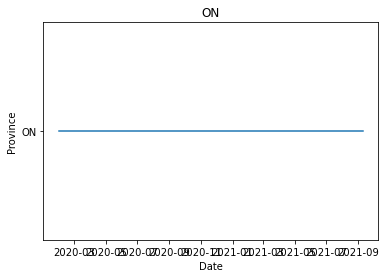

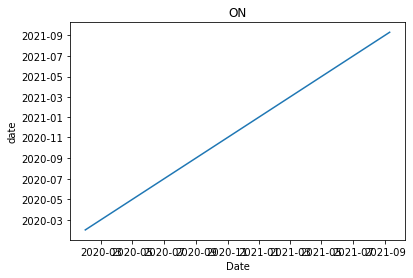

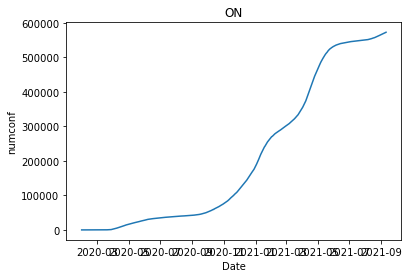

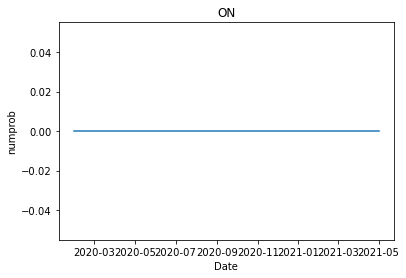

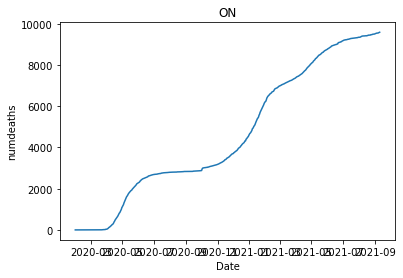

...

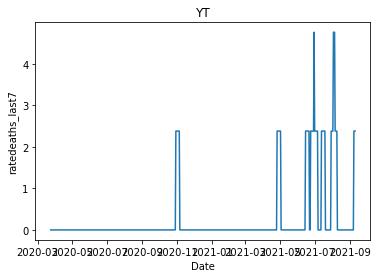

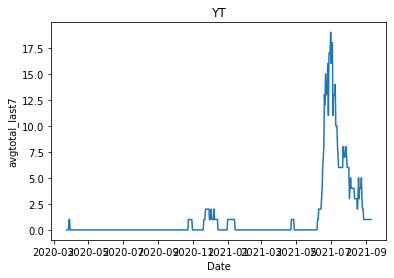

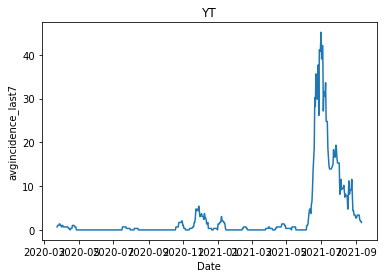

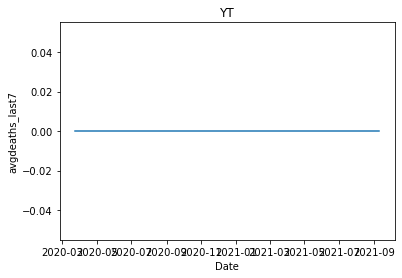

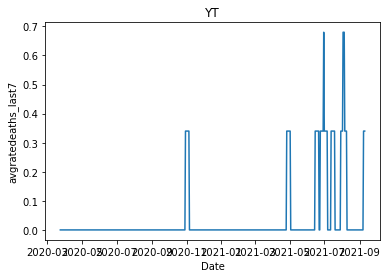

In [43]:
for province in pr:
    for i in df_cases.columns:
        plt.title(province) 
        plt.ylabel(i)
        plt.xlabel('Date')
        df=df_cases.loc[df_cases.Province==province]
        plt.plot(df['date'], df[i])
        plt.show()

### Vaccination Coverage Data

In [44]:
df_vaccinations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 469 entries, 0 to 468
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   week_end                    469 non-null    object 
 1   pruid                       469 non-null    int64  
 2   prename                     469 non-null    object 
 3   prfname                     469 non-null    object 
 4   numtotal_atleast1dose       469 non-null    int64  
 5   numtotal_partially          460 non-null    float64
 6   numtotal_fully              455 non-null    float64
 7   proptotal_atleast1dose      469 non-null    float64
 8   proptotal_partially         460 non-null    float64
 9   proptotal_fully             455 non-null    float64
 10  numeligible_atleast1dose    140 non-null    float64
 11  numeligible_partially       131 non-null    float64
 12  numeligible_fully           140 non-null    float64
 13  propeligible_atleast1dose   140 non

In [45]:
df_vaccinations.head()

,week_end,pruid,prename,prfname,numtotal_atleast1dose,numtotal_partially,numtotal_fully,proptotal_atleast1dose,proptotal_partially,proptotal_fully,numeligible_atleast1dose,numeligible_partially,numeligible_fully,propeligible_atleast1dose,propeligible_partially,propeligible_fully,numweekdelta_atleast1dose,numweekdelta_fully,propweekdelta_atleast1dose,propweekdelta_fully
0,2020-12-19,1,Canada,Canada,12362,12362.0,0.0,0.07,0.07,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-12-19,10,Newfoundland and Labrador,Terre-Neuve-et-Labrador,972,972.0,0.0,0.19,0.19,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-12-19,12,Nova Scotia,Nouvelle-Écosse,1092,1092.0,0.0,0.11,0.11,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-12-19,24,Quebec,Québec,4728,4728.0,0.0,0.06,0.06,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-12-19,46,Manitoba,Manitoba,894,894.0,0.0,0.06,0.06,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [46]:
df_vaccinations[['prename']].value_counts()

prename                  
Yukon                        34
Saskatchewan                 34
Quebec                       34
Nunavut                      34
Nova Scotia                  34
Northwest Territories        34
Newfoundland and Labrador    34
Manitoba                     34
Canada                       34
British Columbia             34
Prince Edward Island         33
New Brunswick                33
Alberta                      33
Ontario                      30
dtype: int64

Again let's replace the values in the prename column with the standard province labels used in the other two dataframes.

In [47]:
df_vaccinations["prename"].replace({'Ontario':'ON', 'Canada':'CAN', 'British Columbia':'BC', 'Quebec':'QC', 'Alberta':'AB', 'Yukon':'YT', 'Saskatchewan':'SK', 'Prince Edward Island':'PEI', 'Nunavut':'NU', 'Nova Scotia':'NS', 'Northwest Territories':'NT', 'Newfoundland and Labrador':'NL', 'New Brunswick':'NB', 'Manitoba':'MB'}, inplace=True)

For consistency, let's also rename the "prename" column to "Province" as in the other dataframes.

In [48]:
df_vaccinations = df_vaccinations.rename(columns={'prename': 'Province'})

In [49]:
df_vaccinations.head()

,week_end,pruid,Province,prfname,numtotal_atleast1dose,numtotal_partially,numtotal_fully,proptotal_atleast1dose,proptotal_partially,proptotal_fully,numeligible_atleast1dose,numeligible_partially,numeligible_fully,propeligible_atleast1dose,propeligible_partially,propeligible_fully,numweekdelta_atleast1dose,numweekdelta_fully,propweekdelta_atleast1dose,propweekdelta_fully
0,2020-12-19,1,CAN,Canada,12362,12362.0,0.0,0.07,0.07,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-12-19,10,NL,Terre-Neuve-et-Labrador,972,972.0,0.0,0.19,0.19,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-12-19,12,NS,Nouvelle-Écosse,1092,1092.0,0.0,0.11,0.11,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-12-19,24,QC,Québec,4728,4728.0,0.0,0.06,0.06,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-12-19,46,MB,Manitoba,894,894.0,0.0,0.06,0.06,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Convert dates to datetime objects.

In [50]:
df_vaccinations['week_end'] = pd.to_datetime(df_vaccinations['week_end'])
df_vaccinations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 469 entries, 0 to 468
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   week_end                    469 non-null    datetime64[ns]
 1   pruid                       469 non-null    int64         
 2   Province                    469 non-null    object        
 3   prfname                     469 non-null    object        
 4   numtotal_atleast1dose       469 non-null    int64         
 5   numtotal_partially          460 non-null    float64       
 6   numtotal_fully              455 non-null    float64       
 7   proptotal_atleast1dose      469 non-null    float64       
 8   proptotal_partially         460 non-null    float64       
 9   proptotal_fully             455 non-null    float64       
 10  numeligible_atleast1dose    140 non-null    float64       
 11  numeligible_partially       131 non-null    float64       

Check the time period covered by the data by province:

In [51]:
for province in df_vaccinations['Province'].unique():
    date=df_vaccinations['week_end'].loc[df_vaccinations.Province == province]
    first=date.min()
    last=date.max()
    print(province, first, last)

CAN 2020-12-19 00:00:00 2021-08-07 00:00:00
NL 2020-12-19 00:00:00 2021-08-07 00:00:00
NS 2020-12-19 00:00:00 2021-08-07 00:00:00
QC 2020-12-19 00:00:00 2021-08-07 00:00:00
MB 2020-12-19 00:00:00 2021-08-07 00:00:00
SK 2020-12-19 00:00:00 2021-08-07 00:00:00
BC 2020-12-19 00:00:00 2021-08-07 00:00:00
YT 2020-12-19 00:00:00 2021-08-07 00:00:00
NT 2020-12-19 00:00:00 2021-08-07 00:00:00
NU 2020-12-19 00:00:00 2021-08-07 00:00:00
PEI 2020-12-26 00:00:00 2021-08-07 00:00:00
NB 2020-12-26 00:00:00 2021-08-07 00:00:00
AB 2020-12-26 00:00:00 2021-08-07 00:00:00
ON 2021-01-16 00:00:00 2021-08-07 00:00:00


The latest first date is 01/16/2021 (Ontario) and the earliest last date is 08/07/2021. 

This is a wider range than the date range there are complete reports for, which was 03/13/2020 to 07/30/2021.

There are still a lot of null values in this dataframe, with some features having more null values than others. This makes sense as during the more recent stages of the pandemic more types of information were likely collected while at the beginning everyones was still learning what data to collect and how to collect it.

Let's look at earliest and latest dates available by feature. For the sake of making it easier to read the output, this is put into a dataframe as well.

In [52]:
times=[]
timecols=['Column', 'Start', 'End']

for column in df_vaccinations.columns:
    date=df_vaccinations['week_end'].loc[df_vaccinations[column].notnull()]
    first=date.min()
    last=date.max()

    times.append([column, first, last])
    
times_df = pd.DataFrame(times, columns=timecols)
print(times_df)

                        Column      Start        End
0                     week_end 2020-12-19 2021-08-07
1                        pruid 2020-12-19 2021-08-07
2                     Province 2020-12-19 2021-08-07
3                      prfname 2020-12-19 2021-08-07
4        numtotal_atleast1dose 2020-12-19 2021-08-07
5           numtotal_partially 2020-12-19 2021-08-07
6               numtotal_fully 2020-12-19 2021-08-07
7       proptotal_atleast1dose 2020-12-19 2021-08-07
8          proptotal_partially 2020-12-19 2021-08-07
9              proptotal_fully 2020-12-19 2021-08-07
10    numeligible_atleast1dose 2021-06-05 2021-08-07
11       numeligible_partially 2021-06-05 2021-08-07
12           numeligible_fully 2021-06-05 2021-08-07
13   propeligible_atleast1dose 2021-06-05 2021-08-07
14      propeligible_partially 2021-06-05 2021-08-07
15          propeligible_fully 2021-06-05 2021-08-07
16   numweekdelta_atleast1dose        NaT        NaT
17          numweekdelta_fully        NaT     

From this we can see that data on the number and proportion of the population eligible for vaccination starts 06/05/2021 and the last four columns have no data for any time point. This is important as the data that is available as early as 12/19/2020 gives the number with one dose or both doses, etc but does not account for the number of people actually eligible. The rollout of the COVID-19 vacccination in Canada was done in stages, with certain populations being given priority. Having the proportion eligible information, as starts on 06/05/2021, helps assess acceptance within the eligible population without diluting the values by looking at the population as a whole.

The pruid and prfname columns are not needed. Let's drop these as well as the four columns that have only null values.

In [53]:
df_vaccinations.drop(axis=1, columns=['pruid','prfname', 'numweekdelta_atleast1dose', 'numweekdelta_fully', 'propweekdelta_atleast1dose', 'propweekdelta_fully'], inplace=True)

In [54]:
df_vaccinations.head()

,week_end,Province,numtotal_atleast1dose,numtotal_partially,numtotal_fully,proptotal_atleast1dose,proptotal_partially,proptotal_fully,numeligible_atleast1dose,numeligible_partially,numeligible_fully,propeligible_atleast1dose,propeligible_partially,propeligible_fully
0,2020-12-19,CAN,12362,12362.0,0.0,0.07,0.07,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-12-19,NL,972,972.0,0.0,0.19,0.19,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-12-19,NS,1092,1092.0,0.0,0.11,0.11,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-12-19,QC,4728,4728.0,0.0,0.06,0.06,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-12-19,MB,894,894.0,0.0,0.06,0.06,0.0,NaN,NaN,NaN,NaN,NaN,NaN


Check correct columns are remaining:

In [55]:
df_vaccinations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 469 entries, 0 to 468
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   week_end                   469 non-null    datetime64[ns]
 1   Province                   469 non-null    object        
 2   numtotal_atleast1dose      469 non-null    int64         
 3   numtotal_partially         460 non-null    float64       
 4   numtotal_fully             455 non-null    float64       
 5   proptotal_atleast1dose     469 non-null    float64       
 6   proptotal_partially        460 non-null    float64       
 7   proptotal_fully            455 non-null    float64       
 8   numeligible_atleast1dose   140 non-null    float64       
 9   numeligible_partially      131 non-null    float64       
 10  numeligible_fully          140 non-null    float64       
 11  propeligible_atleast1dose  140 non-null    float64       
 12  propelig

Preliminary look at the features over time by province:

In [56]:
pr2=df_vaccinations.Province.unique()
print(pr2)

['CAN' 'NL' 'NS' 'QC' 'MB' 'SK' 'BC' 'YT' 'NT' 'NU' 'PEI' 'NB' 'AB' 'ON']


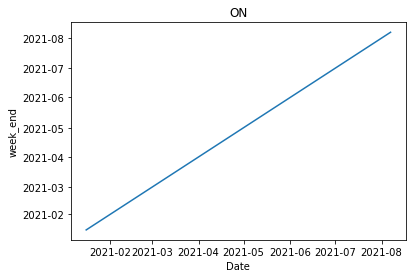

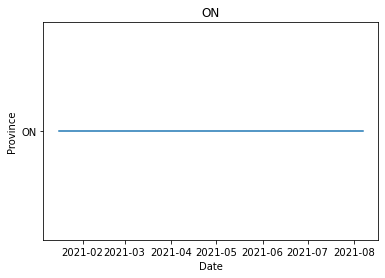

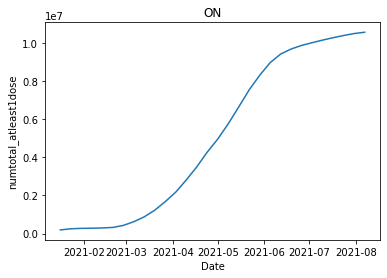

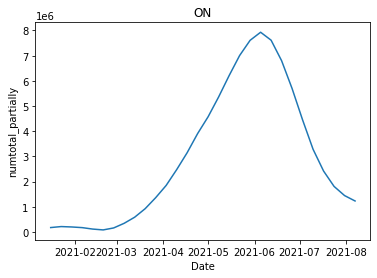

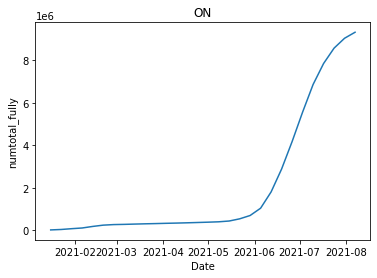

...

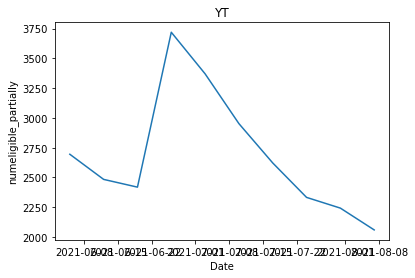

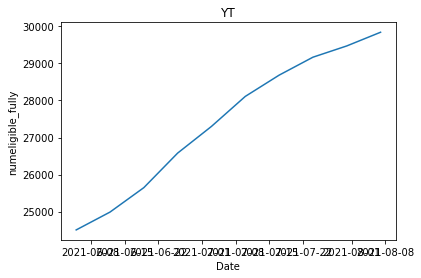

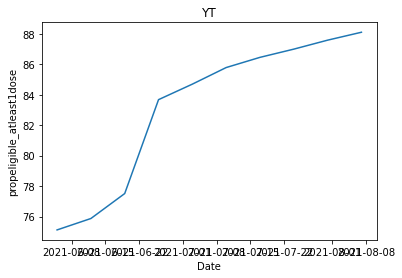

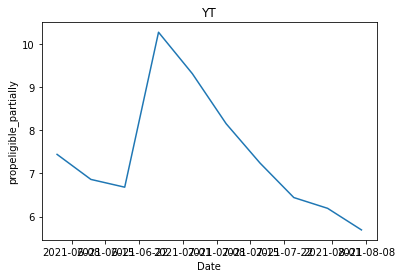

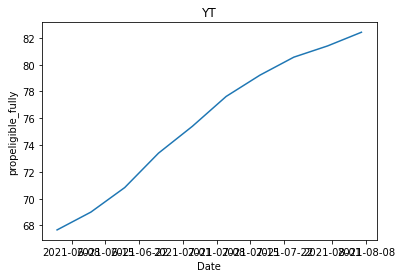

In [57]:
for province in pr:
    for i in df_vaccinations.columns:
        plt.title(province) 
        plt.ylabel(i)
        plt.xlabel('Date')
        df=df_vaccinations.loc[df_vaccinations.Province==province]
        plt.plot(df['week_end'], df[i])
        plt.show()

Save the cleaned data for use in exploratory data analysis in the next notebook.

In [58]:
df_reports.to_csv(r'../Data/reports_clean.csv')
df_cases.to_csv(r'../Data/cases_clean.csv')
df_vaccinations.to_csv(r'../Data/vaccinations_clean.csv')